# CS885 Census Project

This is Chris, Vecna and Raiyan's ipynb file for experiments run for our final project.

## Loading Packages and Files

In [4]:
import csv
import pandas as pd
import numpy as np

In [5]:
!pip install z3-solver

import z3
from z3 import *
import itertools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [7]:
import csv
i = 0
with open('/content/gdrive/MyDrive/Datasets/CensusTerritories.csv', encoding='latin-1') as csvfile:
    reader = csv.reader(csvfile)
    for row in reader:
        print(row)
        i+=1
        if (i>5):
          break

df = pd.read_csv('/content/gdrive/MyDrive/Datasets/CensusTerritories.csv', encoding='latin-1')

['CENSUS_YEAR', 'DGUID', 'ALT_GEO_CODE', 'GEO_LEVEL', 'GEO_NAME', 'TNR_SF', 'TNR_LF', 'DATA_QUALITY_FLAG', 'CHARACTERISTIC_ID', 'CHARACTERISTIC_NAME', 'CHARACTERISTIC_NOTE', 'C1_COUNT_TOTAL', 'SYMBOL', 'C2_COUNT_MEN+', 'SYMBOL', 'C3_COUNT_WOMEN+', 'SYMBOL', 'C10_RATE_TOTAL', 'SYMBOL', 'C11_RATE_MEN+', 'SYMBOL', 'C12_RATE_WOMEN+', 'SYMBOL']
['2021', '2021A000011124', '01', 'Country', 'Canada', '3.1', '4.3', '20000', '1', 'Population, 2021', '1', '36991981', '', '', '...', '', '...', '', '...', '', '...', '', '...']
['2021', '2021A000011124', '01', 'Country', 'Canada', '3.1', '4.3', '20000', '2', 'Population, 2016', '1', '35151728', '', '', '...', '', '...', '', '...', '', '...', '', '...']
['2021', '2021A000011124', '01', 'Country', 'Canada', '3.1', '4.3', '20000', '3', 'Population percentage change, 2016 to 2021', '', '5.2', '', '', '...', '', '...', '5.2', '', '', '...', '', '...']
['2021', '2021A000011124', '01', 'Country', 'Canada', '3.1', '4.3', '20000', '4', 'Total private dwellin

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
townPops = df.loc[df['CHARACTERISTIC_NAME'] == 'Population, 2021']
onlySmallTowns = townPops.loc[df['C1_COUNT_TOTAL'] == 40]
onlySmallTownNames = onlySmallTowns['GEO_NAME'].values
print(onlySmallTowns)
print(onlySmallTownNames)

        CENSUS_YEAR              DGUID  ALT_GEO_CODE           GEO_LEVEL  \
181884         2021   2021A00056001049       6001049  Census subdivision   
183861         2021  2021S051260010120      60010120  Dissemination area   

                                GEO_NAME  TNR_SF  TNR_LF  DATA_QUALITY_FLAG  \
181884  Destruction Bay, Settlement (SÉ)     0.0    12.5                999   
183861                          60010120     0.0    12.5                999   

        CHARACTERISTIC_ID CHARACTERISTIC_NAME  ...  C2_COUNT_MEN+  SYMBOL.1  \
181884                  1    Population, 2021  ...            NaN       ...   
183861                  1    Population, 2021  ...            NaN       ...   

       C3_COUNT_WOMEN+  SYMBOL.2 C10_RATE_TOTAL  SYMBOL.3 C11_RATE_MEN+  \
181884             NaN       ...            NaN       ...           NaN   
183861             NaN       ...            NaN       ...           NaN   

        SYMBOL.4 C12_RATE_WOMEN+  SYMBOL.5  
181884       ...        

In [9]:
# Load a single town data #

currTown = df.loc[df['GEO_NAME'] == onlySmallTownNames[0]]
print((currTown))

        CENSUS_YEAR             DGUID  ALT_GEO_CODE           GEO_LEVEL  \
181884         2021  2021A00056001049       6001049  Census subdivision   
181885         2021  2021A00056001049       6001049  Census subdivision   
181886         2021  2021A00056001049       6001049  Census subdivision   
181887         2021  2021A00056001049       6001049  Census subdivision   
181888         2021  2021A00056001049       6001049  Census subdivision   
...             ...               ...           ...                 ...   
183856         2021  2021A00056001049       6001049  Census subdivision   
183857         2021  2021A00056001049       6001049  Census subdivision   
183858         2021  2021A00056001049       6001049  Census subdivision   
183859         2021  2021A00056001049       6001049  Census subdivision   
183860         2021  2021A00056001049       6001049  Census subdivision   

                                GEO_NAME  TNR_SF  TNR_LF  DATA_QUALITY_FLAG  \
181884  Destruction 

In [10]:
import itertools


# This generates unique feasible solutions (taken from stack overflow)
def models(formula, max=10000):
    " a generator of up to max models "
    solver = Solver()
    solver.add(formula)

    count = 0
    while count<max or max==0:
        count += 1

        if solver.check() == sat:
            model = solver.model()
            yield model
            
            # exclude this model
            block = []
            for z3_decl in model: # FuncDeclRef
                arg_domains = []
                for i in range(z3_decl.arity()):
                    domain, arg_domain = z3_decl.domain(i), []
                    for j in range(domain.num_constructors()):
                        arg_domain.append( domain.constructor(j) () )
                    arg_domains.append(arg_domain)
                for args in itertools.product(*arg_domains):
                    block.append(z3_decl(*args) != model.eval(z3_decl(*args)))
            solver.add(Or(block))

## Try Bigger Town but with only 6 attributes

I.e. Experiments with Colville Lake

In [17]:
townPops = df.loc[df['CHARACTERISTIC_NAME'] == 'Population, 2021']
onlySmallTowns = townPops.loc[df['C1_COUNT_TOTAL'] == 110]
onlySmallTownNames = onlySmallTowns['GEO_NAME'].values
print(onlySmallTowns)
print(onlySmallTownNames)

# Load a single town data #
currTown = df.loc[df['GEO_NAME'] == onlySmallTownNames[0]]
print((currTown))

        CENSUS_YEAR              DGUID  ALT_GEO_CODE           GEO_LEVEL  \
294573         2021   2021A00056102012       6102012  Census subdivision   
296550         2021  2021S051261020031      61020031  Dissemination area   

                               GEO_NAME  TNR_SF  TNR_LF  DATA_QUALITY_FLAG  \
294573  Colville Lake, Settlement (SET)     0.0     0.0                909   
296550                         61020031     0.0     0.0                909   

        CHARACTERISTIC_ID CHARACTERISTIC_NAME  ...  C2_COUNT_MEN+  SYMBOL.1  \
294573                  1    Population, 2021  ...            NaN       ...   
296550                  1    Population, 2021  ...            NaN       ...   

       C3_COUNT_WOMEN+  SYMBOL.2 C10_RATE_TOTAL  SYMBOL.3 C11_RATE_MEN+  \
294573             NaN       ...            NaN       ...           NaN   
296550             NaN       ...            NaN       ...           NaN   

        SYMBOL.4 C12_RATE_WOMEN+  SYMBOL.5  
294573       ...           

In [18]:
import z3
from z3 import *
import itertools


x9, x10, x11, x12, x13, x24 = Ints('x9 x10 x11 x12 x13 x24')
_x9 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 9]['C1_COUNT_TOTAL'].values[0]
_x10 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 10]['C1_COUNT_TOTAL'].values[0]
_x11 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 11]['C1_COUNT_TOTAL'].values[0]
_x12 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 12]['C1_COUNT_TOTAL'].values[0]
_x13 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 13]['C1_COUNT_TOTAL'].values[0]
_x24 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 24]['C1_COUNT_TOTAL'].values[0]

allAttributes = [_x9,_x10,_x11,_x12,_x13,_x24]
lowerBounds = []
upperBounds = []

for i in range(len(allAttributes)):
  currAttribute = allAttributes[i]
  if (currAttribute == 0):
    lowerBounds.append(0)
    upperBounds.append(4)
  else:
    lowerBounds.append(currAttribute-4)
    upperBounds.append(currAttribute+4)

print(allAttributes)
print(lowerBounds)
print(upperBounds)

F = [x9+x13+x24==110,
     x9==x10+x11+x12,
     x9>=lowerBounds[0],x9<=upperBounds[0],
     x10>=lowerBounds[1],x10<=upperBounds[1],
     x11>=lowerBounds[2],x11<=upperBounds[2],
     x12>=lowerBounds[3],x12<=upperBounds[3],
     x13>=lowerBounds[4],x13<=upperBounds[4],
     x24>=lowerBounds[5],x24<=upperBounds[5]]


abstractAnalysisVars = [x9,x10,x11,x12,x13,x24]
analysisVars = [_x9,_x10,_x11,_x12,_x13,_x24]

oddsDict = [1.0, 0.8, 0.6, 0.4, 0.2]

def calculateOdds(s):
  oddsSol = []
  for i in range(len(s)):
    odd = oddsDict[int(abs(analysisVars[i]-s[i]))]
    oddsSol.append(odd)
  return (oddsSol, np.product(oddsSol))


i=0
allSols = models(F,max=50000)
allSolsList = []
for sol in allSols:
  currSol = []
  for var in abstractAnalysisVars:
    currSol.append(sol[var].as_long())
  allSolsList.append(currSol)
  i+=1
print(i)

allSolsOdds = []
allSolsSums = []
testOdd, testOddSum = calculateOdds(allSolsList[0])
for sol in allSolsList:
  o,s = calculateOdds(sol)
  allSolsOdds.append(o)
  allSolsSums.append(s)

print(allSolsOdds)
print(allSolsSums)

sumsSorted, oddsSorted, solsSorted = zip(*sorted(zip(allSolsSums, allSolsOdds,allSolsList), reverse=True))

print("There are " + str(len(sumsSorted)) + " unique solutions")
print("The most likely solution is " + str(solsSorted[0]))
print("This solution is " + str(sumsSorted[0] / sumsSorted[1]) + " times more likely than the next most likely solution")
print("The total liklihood of this solution is " + str(sumsSorted[0] / sum(sumsSorted)))


### Attribute based statistics ###

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
uniqueValues = np.unique(arrSols[:,0])

sumsSortedScaled = []
for i in range(len(sumsSorted)):
  sumsSortedScaled.append(sumsSorted[i]/sum(sumsSorted))

# creates a dictionary with keys and values
dictionary = dict.fromkeys(uniqueValues, 0.0)

for i in range(len(arrSols)):
  dictionary[arrSols[i,0]] += sumsSortedScaled[i]

attributeOddsList = []

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
dicts = []

for i in range(len(abstractAnalysisVars)):
  uniqueValues = np.unique(arrSols[:,i])

  sumsSortedScaled = []
  for ii in range(len(sumsSorted)):
    sumsSortedScaled.append(sumsSorted[ii]/sum(sumsSorted))

  # creates a dictionary with keys and values
  dictionary = dict.fromkeys(uniqueValues, 0.0)

  for ii in range(len(arrSols)):
    dictionary[arrSols[ii,i]] += sumsSortedScaled[ii]

  print(dictionary)
  dicts.append(dictionary)

[25.0, 10.0, 10.0, 15.0, 75.0, 5.0]
[21.0, 6.0, 6.0, 11.0, 71.0, 1.0]
[29.0, 14.0, 14.0, 19.0, 79.0, 9.0]
546
[[0.2, 0.6, 0.2, 0.2, 0.2, 0.4], [1.0, 0.2, 0.4, 0.4, 0.4, 0.6], [0.8, 0.2, 0.4, 0.2, 0.4, 0.4], [1.0, 0.2, 0.6, 0.2, 0.4, 0.6], [0.8, 0.2, 0.8, 0.2, 0.6, 0.6], [1.0, 0.2, 0.4, 0.4, 0.6, 0.4], [1.0, 0.2, 0.4, 0.4, 0.8, 0.2], [0.4, 0.2, 0.4, 1.0, 1.0, 0.6], [0.2, 0.2, 0.4, 0.8, 0.8, 0.6], [0.2, 0.2, 0.4, 0.8, 0.6, 0.4], [0.8, 0.2, 0.4, 0.6, 0.8, 0.4], [0.6, 0.2, 0.4, 0.8, 1.0, 0.4], [0.4, 0.2, 0.4, 1.0, 0.8, 0.4], [0.8, 0.2, 0.4, 0.6, 1.0, 0.2], [0.8, 0.2, 0.4, 0.6, 0.4, 0.8], [0.8, 0.2, 0.4, 0.6, 0.2, 1.0], [0.8, 0.2, 0.4, 0.6, 0.6, 0.6], [0.6, 0.2, 0.6, 0.6, 0.4, 1.0], [0.6, 0.2, 0.6, 0.6, 0.2, 0.8], [0.6, 0.2, 0.6, 0.6, 0.8, 0.6], [0.6, 0.2, 0.6, 0.6, 0.6, 0.8], [0.6, 0.2, 0.6, 0.6, 1.0, 0.4], [0.6, 0.2, 0.6, 0.6, 0.8, 0.2], [0.2, 0.2, 1.0, 0.6, 0.8, 1.0], [0.2, 0.2, 1.0, 0.6, 0.6, 0.8], [0.2, 0.2, 1.0, 0.6, 0.4, 0.6], [0.4, 0.2, 0.8, 0.6, 0.4, 0.8], [0.2, 0.2, 0.8, 0.4, 0.4,

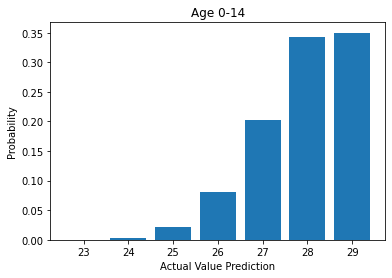

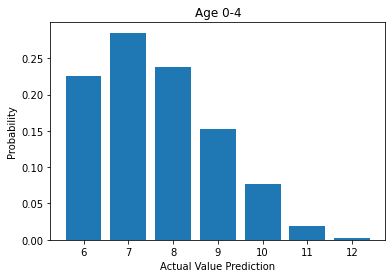

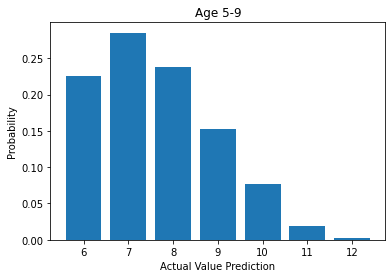

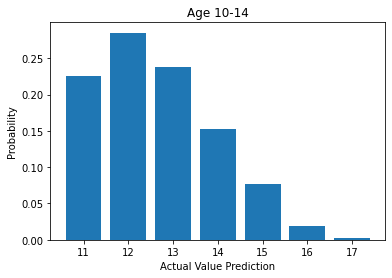

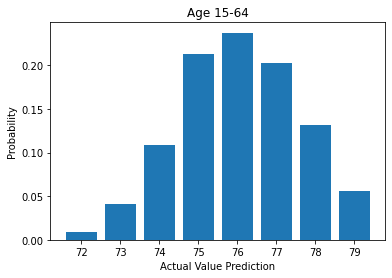

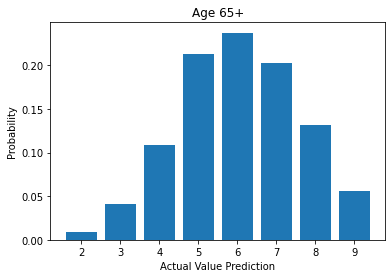

In [23]:
import matplotlib.pyplot as plt
attributeNames = ['Age 0-14','Age 0-4','Age 5-9','Age 10-14','Age 15-64','Age 65+']

for d in range(len(dicts)):
  plt.bar(dicts[d].keys(), dicts[d].values())
  plt.title(attributeNames[d])
  plt.xlabel("Actual Value Prediction")
  plt.ylabel("Probability")
  plt.show()

## Simulated Towns with Correct Age Pyramid

In [11]:
### Artificially front-end a town pop to be young

# Generate Town

import numpy as np

numCitizens = 100
numGenerations = 50

allGenerations = []
for i in range(numGenerations):
  randomPop = np.random.randint(0, 100, numCitizens)
  allGenerations.append(randomPop)

print(allGenerations[0])

# Sort into age bins

x9_bin = [0,14]
x10_bin = [0,4]
x11_bin = [5,9]
x12_bin = [10,14]
x13_bin = [15,64]
x24_bin = [65,200]

bins = [x9_bin,x10_bin,x11_bin,x12_bin,x13_bin,x24_bin]

allBincounts = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allGenerations[i]
  for ii in range(numCitizens):
    currentCitizen = currentGeneration[ii]
    for iii in range(len(bins)):
      if (currentCitizen >= bins[iii][0] and currentCitizen <= bins[iii][1]):
        allBincounts[i,iii] += 1

print(allBincounts)


import math

def roundup(x):
    return int(math.ceil(x / 5.0)) * 5

def rounddown(x):
    return int(math.floor(x / 5.0)) * 5

transitionProbabilities = [1.0, 0.8, 0.6, 0.4, 0.2]

allGenerationsRandomRounded = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allBincounts[i]
  for ii in range(len(bins)):
    currentBin = currentGeneration[ii]
    if (currentBin%5 == 0):
      allGenerationsRandomRounded[i,ii] = currentBin
    elif (currentBin < 5):
      absoluteDifference = int(5-currentBin)
      roundedVal = np.random.choice([5,0], p=[(transitionProbabilities[absoluteDifference]),
                                              (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal
    else:
      lowerRound = rounddown(currentBin)
      upperRound = roundup(currentBin)
      absoluteDifference = int(currentBin-lowerRound)
      roundedVal = np.random.choice([lowerRound,upperRound], p=[(transitionProbabilities[absoluteDifference]),
                                                                (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal

print(allGenerationsRandomRounded[0])
print(allGenerationsRandomRounded.shape)

[14 39 49 28 50 95 69 78 63 99 34 65 25  8 70 81 95 43 12  4 71 72 75 43
 84 58 82 23 61 50 10 94 42 11 85  3 79 15 75 73 78 50 45 99 93 42 63 81
 86 46 13 19 26 72 29  3 76 51 13 36 89 86 39 28 72 43 52 81 83 28 58 21
 91 60 54 18 73 41 60 10  9 25  6 56 33  9 94 66 80 52 48 12  0 12 34 27
 72 36 26  3]
[[18.  5.  4.  9. 46. 36.]
 [22.  9.  7.  6. 41. 37.]
 [15.  9.  4.  2. 49. 36.]
 [18.  6.  5.  7. 45. 37.]
 [14.  6.  4.  4. 48. 38.]
 [17.  5.  8.  4. 47. 36.]
 [11.  5.  3.  3. 56. 33.]
 [15.  2.  7.  6. 50. 35.]
 [15.  5.  5.  5. 47. 38.]
 [18.  6.  8.  4. 45. 37.]
 [18.  8.  3.  7. 49. 33.]
 [25.  7.  9.  9. 49. 26.]
 [18.  6.  6.  6. 52. 30.]
 [17.  7.  4.  6. 57. 26.]
 [13.  6.  3.  4. 57. 30.]
 [15.  5.  5.  5. 48. 37.]
 [14.  4.  5.  5. 51. 35.]
 [14.  6.  3.  5. 56. 30.]
 [17. 12.  1.  4. 49. 34.]
 [16.  4.  6.  6. 53. 31.]
 [24.  5. 10.  9. 50. 26.]
 [20.  9.  4.  7. 45. 35.]
 [14.  7.  2.  5. 58. 28.]
 [22.  6.  8.  8. 46. 32.]
 [12.  3.  4.  5. 51. 37.]
 [16.  2. 10.  4. 5

In [12]:
allGenerationsRawBins = np.random.choice([0,1,2,3,4,5], size=(numGenerations,numCitizens),p=[0,0.05,0.056,0.057,0.647,0.19])
allGenerationsBins = np.zeros((numGenerations, len(bins)))
for i in range(len(allGenerationsRawBins)):
  allGenerationsBins[i] = np.bincount(allGenerationsRawBins[i])
  allGenerationsBins[i,0] = allGenerationsBins[i,1] + allGenerationsBins[i,2] + allGenerationsBins[i,3]
allBincounts = allGenerationsBins

import math

def roundup(x):
    return int(math.ceil(x / 5.0)) * 5

def rounddown(x):
    return int(math.floor(x / 5.0)) * 5

transitionProbabilities = [1.0, 0.8, 0.6, 0.4, 0.2]

allGenerationsRandomRounded = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allBincounts[i]
  for ii in range(len(bins)):
    currentBin = currentGeneration[ii]
    if (currentBin%5 == 0):
      allGenerationsRandomRounded[i,ii] = currentBin
    elif (currentBin < 5):
      absoluteDifference = int(5-currentBin)
      roundedVal = np.random.choice([5,0], p=[(transitionProbabilities[absoluteDifference]),
                                              (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal
    else:
      lowerRound = rounddown(currentBin)
      upperRound = roundup(currentBin)
      absoluteDifference = int(currentBin-lowerRound)
      roundedVal = np.random.choice([lowerRound,upperRound], p=[(transitionProbabilities[absoluteDifference]),
                                                                (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal

print(allGenerationsRandomRounded[0])
print(allGenerationsRandomRounded.shape)

[20.  5.  5. 10. 55. 25.]
(50, 6)


In [13]:
def calculateOdds(s):
  oddsSol = []
  for i in range(len(s)):
    odd = oddsDict[int(abs(analysisVars[i]-s[i]))]
    oddsSol.append(odd)
  return (oddsSol, np.product(oddsSol))

allDicts = []
for t in range(numGenerations):

  x9, x10, x11, x12, x13, x24 = Ints('x9 x10 x11 x12 x13 x24')
  allAttributes = allGenerationsRandomRounded[t]
  lowerBounds = []
  upperBounds = []

  for i in range(len(allAttributes)):
    currAttribute = allAttributes[i]
    if (currAttribute == 0):
      lowerBounds.append(0)
      upperBounds.append(4)
    else:
      lowerBounds.append(currAttribute-4)
      upperBounds.append(currAttribute+4)
    
  F = [x9+x13+x24==numCitizens,
     x9==x10+x11+x12,
     x9>=lowerBounds[0],x9<=upperBounds[0],
     x10>=lowerBounds[1],x10<=upperBounds[1],
     x11>=lowerBounds[2],x11<=upperBounds[2],
     x12>=lowerBounds[3],x12<=upperBounds[3],
     x13>=lowerBounds[4],x13<=upperBounds[4],
     x24>=lowerBounds[5],x24<=upperBounds[5]]

  abstractAnalysisVars = [x9,x10,x11,x12,x13,x24]
  analysisVars = allAttributes

  oddsDict = [1.0, 0.8, 0.6, 0.4, 0.2]

  i=0
  allSols = models(F)
  allSolsList = []
  for sol in allSols:
    currSol = []
    for var in abstractAnalysisVars:
      currSol.append(sol[var].as_long())
    allSolsList.append(currSol)
    i+=1
  print(i)

  allSolsOdds = []
  allSolsSums = []
  testOdd, testOddSum = calculateOdds(allSolsList[0])
  for sol in allSolsList:
    o,s = calculateOdds(sol)
    allSolsOdds.append(o)
    allSolsSums.append(s)

  print(allSolsList)
  print(allSolsOdds)
  print(allSolsSums)

  sumsSorted, oddsSorted, solsSorted = zip(*sorted(zip(allSolsSums, allSolsOdds,allSolsList), reverse=True))

  print("The most likely solution is " + str(solsSorted[0]))
  print("This solution is " + str(sumsSorted[0] / sumsSorted[1]) + " times more likely than the next most likely solution")
  print("The total liklihood of this solution is " + str(sumsSorted[0] / sum(sumsSorted)))

  ### Attribute based statistics ###

  arrOdds = np.array(oddsSorted)
  arrSols = np.array(solsSorted)
  uniqueValues = np.unique(arrSols[:,0])

  sumsSortedScaled = []
  for i in range(len(sumsSorted)):
    sumsSortedScaled.append(sumsSorted[i]/sum(sumsSorted))

  # creates a dictionary with keys and values
  dictionary = dict.fromkeys(uniqueValues, 0.0)

  for i in range(len(arrSols)):
    dictionary[arrSols[i,0]] += sumsSortedScaled[i]

  attributeOddsList = []

  arrOdds = np.array(oddsSorted)
  arrSols = np.array(solsSorted)
  dicts = []

  for i in range(len(abstractAnalysisVars)):
    uniqueValues = np.unique(arrSols[:,i])

    sumsSortedScaled = []
    for ii in range(len(sumsSorted)):
      sumsSortedScaled.append(sumsSorted[ii]/sum(sumsSorted))

    # creates a dictionary with keys and values
    dictionary = dict.fromkeys(uniqueValues, 0.0)

    for ii in range(len(arrSols)):
      dictionary[arrSols[ii,i]] += sumsSortedScaled[ii]

    print(dictionary)
    dicts.append(dictionary)
  allDicts.append(dicts)

3381
[[24, 9, 1, 14, 55, 21], [16, 1, 9, 6, 55, 29], [17, 2, 8, 7, 55, 28], [16, 2, 7, 7, 56, 28], [16, 4, 6, 6, 56, 28], [16, 5, 5, 6, 56, 28], [16, 6, 4, 6, 56, 28], [16, 5, 3, 8, 56, 28], [17, 8, 3, 6, 56, 27], [17, 7, 3, 7, 54, 29], [18, 7, 4, 7, 53, 29], [20, 6, 8, 6, 51, 29], [19, 6, 7, 6, 52, 29], [18, 6, 6, 6, 53, 29], [17, 6, 5, 6, 54, 29], [16, 6, 4, 6, 55, 29], [20, 6, 7, 7, 51, 29], [16, 6, 2, 8, 55, 29], [16, 6, 1, 9, 55, 29], [16, 6, 3, 7, 55, 29], [18, 6, 2, 10, 53, 29], [19, 6, 2, 11, 52, 29], [20, 6, 3, 11, 51, 29], [20, 6, 2, 12, 51, 29], [20, 6, 4, 10, 51, 29], [20, 6, 5, 9, 51, 29], [20, 6, 6, 8, 51, 29], [19, 6, 6, 7, 52, 29], [19, 6, 5, 8, 52, 29], [19, 6, 4, 9, 52, 29], [18, 6, 4, 8, 53, 29], [17, 6, 3, 8, 54, 29], [18, 6, 3, 9, 53, 29], [17, 6, 2, 9, 54, 29], [18, 6, 1, 11, 53, 29], [17, 6, 1, 10, 54, 29], [19, 6, 3, 10, 52, 29], [19, 6, 1, 12, 52, 29], [20, 6, 1, 13, 51, 29], [17, 6, 4, 7, 54, 29], [18, 6, 5, 7, 53, 29], [19, 6, 7, 6, 53, 28], [21, 6, 9, 6, 52,

In [14]:
print(len(allDicts))
print(allBincounts)

histogramBincountsTrue = np.zeros((10))
histogramBincountCounter = np.zeros((10))
binsLower = np.arange(0, 1, 0.1)
binsUpper = np.arange(0.1, 1.1, 0.1)
print(binsLower)
print(binsUpper)
for i in range(len(allBincounts)):
  currDict = allDicts[i]
  x9 = currDict[0]
  x10 = currDict[1]
  x11 = currDict[2]
  x12 = currDict[3]
  x13 = currDict[4]
  x24 = currDict[5]
  xs = [x9,x10,x11,x12,x13,x24]
  for ii in range(len(xs)):
    corrAnswer = allBincounts[i,ii]
    currVarDict = xs[ii]
    currVarList = list(currVarDict.values())
    #print(currVarDict)
    #print(currVarList)
    for iii in range(len(currVarList)):
      for iiii in range(len(binsLower)):
        if ((currVarList[iii] >= binsLower[iiii]) and (currVarList[iii] < binsUpper[iiii])):
          histogramBincountCounter[iiii] += 1
    correctProbs = currVarDict[corrAnswer]
    for iii in range(len(binsLower)):
      if ((correctProbs >= binsLower[iii]) and (correctProbs < binsUpper[iii])):
        histogramBincountsTrue[iii] += 1
    #print(currVarDict[corrAnswer])

50
[[20.  7.  6.  7. 54. 26.]
 [10.  2.  4.  4. 73. 17.]
 [17.  8.  4.  5. 64. 19.]
 [24.  9. 10.  5. 60. 16.]
 [17.  8.  5.  4. 62. 21.]
 [18.  7.  6.  5. 65. 17.]
 [11.  4.  3.  4. 67. 22.]
 [13.  2.  7.  4. 70. 17.]
 [17.  5.  6.  6. 67. 16.]
 [15.  3.  5.  7. 68. 17.]
 [15.  4.  5.  6. 72. 13.]
 [24.  5.  8. 11. 54. 22.]
 [23. 11.  8.  4. 61. 16.]
 [17.  6.  6.  5. 74.  9.]
 [16.  7.  2.  7. 64. 20.]
 [21.  7.  6.  8. 57. 22.]
 [20.  3. 10.  7. 55. 25.]
 [23. 13.  4.  6. 59. 18.]
 [20. 11.  4.  5. 68. 12.]
 [14.  3.  6.  5. 67. 19.]
 [19.  4.  9.  6. 60. 21.]
 [16.  6.  2.  8. 65. 19.]
 [16.  8.  1.  7. 71. 13.]
 [12.  2.  5.  5. 76. 12.]
 [12.  5.  3.  4. 68. 20.]
 [24. 10.  8.  6. 62. 14.]
 [18.  6.  5.  7. 63. 19.]
 [22.  6.  8.  8. 57. 21.]
 [ 7.  3.  2.  2. 71. 22.]
 [15.  3.  2. 10. 65. 20.]
 [12.  5.  5.  2. 70. 18.]
 [10.  5.  4.  1. 73. 17.]
 [18.  3.  3. 12. 65. 17.]
 [19.  5.  5.  9. 59. 22.]
 [21.  7.  8.  6. 56. 23.]
 [19.  2. 11.  6. 63. 18.]
 [22.  7.  5. 10. 60. 18.

[ 45. 107. 143.   3.   1.   1.   0.   0.   0.   0.]
[1.21e+03 7.06e+02 5.89e+02 1.60e+01 1.00e+00 3.00e+00 1.00e+00 0.00e+00
 0.00e+00 0.00e+00]
[0.03719008 0.15155807 0.24278438 0.1875     1.         0.33333333
 0.         0.         0.         0.        ]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]


<ipython-input-16-a63a4259b26f>:3: RuntimeWarning: invalid value encountered in true_divide
  normalizedHistogram = histogramBincountsTrue / histogramBincountCounter


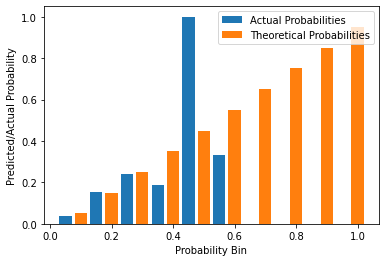

In [16]:
print(histogramBincountsTrue)
print(histogramBincountCounter)
normalizedHistogram = histogramBincountsTrue / histogramBincountCounter
normalizedHistogram = np.nan_to_num(normalizedHistogram)
print(normalizedHistogram)
print(binsLower)
theoreticalValues = [0.05,0.15,0.25,0.35,0.45,0.55,0.65,0.75,0.85,0.95]

import matplotlib.pyplot as plt

X_axis = binsLower+0.05
plt.bar(X_axis, normalizedHistogram, 0.04, label = 'Actual Probabilities')
plt.bar(X_axis+0.05, theoreticalValues, 0.04, label = 'Theoretical Probabilities')
plt.xlabel("Probability Bin")
plt.ylabel("Predicted/Actual Probability")
plt.legend()

## Search NWT and Ontario for Hard Privacy Violations

In [ ]:
townPops = df.loc[df['CHARACTERISTIC_NAME'] == 'Population, 2021']
splits = np.array_split(df, 343)
print(splits)

#df2 = pd.read_csv('/content/gdrive/MyDrive/Datasets/CensusOntario.csv', encoding='latin-1')
#townPops2 = df2.loc[df2['CHARACTERISTIC_NAME'] == 'Population, 2021']
#print(len(townPops2))
#splits2 = np.array_split(df2, len(townPops2))

[      CENSUS_YEAR           DGUID  ALT_GEO_CODE GEO_LEVEL GEO_NAME  TNR_SF  \
0            2021  2021A000011124             1   Country   Canada     3.1   
1            2021  2021A000011124             1   Country   Canada     3.1   
2            2021  2021A000011124             1   Country   Canada     3.1   
3            2021  2021A000011124             1   Country   Canada     3.1   
4            2021  2021A000011124             1   Country   Canada     3.1   
...           ...             ...           ...       ...      ...     ...   
1972         2021  2021A000011124             1   Country   Canada     3.1   
1973         2021  2021A000011124             1   Country   Canada     3.1   
1974         2021  2021A000011124             1   Country   Canada     3.1   
1975         2021  2021A000011124             1   Country   Canada     3.1   
1976         2021  2021A000011124             1   Country   Canada     3.1   

      TNR_LF  DATA_QUALITY_FLAG  CHARACTERISTIC_ID  \
0       

In [ ]:
for i in range(len(splits)):
  currSplit = splits[i]
  pop = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 1]['C1_COUNT_TOTAL'].values[0]
  young = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 9]['C1_COUNT_TOTAL'].values[0]
  middleAge = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 13]['C1_COUNT_TOTAL'].values[0]
  old = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 24]['C1_COUNT_TOTAL'].values[0]
  if (young+middleAge+old+12 == pop):
    print(i)
  if (young+middleAge+old-12 == pop):
    print(i)

#for i in range(len(splits2)):
#  currSplit = splits2[i]
#  pop = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 1]['C1_COUNT_TOTAL'].values[0]
#  young = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 9]['C1_COUNT_TOTAL'].values[0]
#  middleAge = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 13]['C1_COUNT_TOTAL'].values[0]
#  old = currSplit.loc[currSplit['CHARACTERISTIC_ID'] == 24]['C1_COUNT_TOTAL'].values[0]
#  if (young+middleAge+old+12 == pop):
#    print(i)
#  if (young+middleAge+old-12 == pop):
#    print(i)

## Misc Experiments (Not Nessicarily Part of the Paper)

In [10]:
import z3
from z3 import *
import itertools


x9, x13, x24, x25, x26, x27, x28, x29 = Ints('x9 x13 x24 x25 x26 x27 x28 x29')
_x9 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 9]['C1_COUNT_TOTAL'].values[0]
_x13 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 13]['C1_COUNT_TOTAL'].values[0]
_x24 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 24]['C1_COUNT_TOTAL'].values[0]
_x25 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 25]['C1_COUNT_TOTAL'].values[0]
_x26 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 26]['C1_COUNT_TOTAL'].values[0]
_x27 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 27]['C1_COUNT_TOTAL'].values[0]
_x28 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 28]['C1_COUNT_TOTAL'].values[0]
_x29 = currTown.loc[currTown['CHARACTERISTIC_ID'] == 29]['C1_COUNT_TOTAL'].values[0]

allAttributes = [_x9,_x13,_x24,_x25,_x26,_x27,_x28,_x29]
lowerBounds = []
upperBounds = []

for i in range(len(allAttributes)):
  currAttribute = allAttributes[i]
  if (currAttribute == 0):
    lowerBounds.append(0)
    upperBounds.append(4)
  else:
    lowerBounds.append(currAttribute-4)
    upperBounds.append(currAttribute+4)

In [11]:
F = [x9+x13+x24==40,
     x9>=lowerBounds[0],x9<=upperBounds[0],
     x13>=lowerBounds[1],x13<=upperBounds[1],
     x24>=lowerBounds[2],x24<=upperBounds[2]]

abstractAnalysisVars = [x9,x13,x24]
analysisVars = [_x9,_x13,_x24]
#solve(F)

In [12]:
oddsDict = [1.0, 0.8, 0.6, 0.4, 0.2]

def calculateOdds(s):
  oddsSol = []
  for i in range(len(s)):
    odd = oddsDict[int(abs(analysisVars[i]-s[i]))]
    oddsSol.append(odd)
  return (oddsSol, np.product(oddsSol))


i=0
allSols = models(F)
allSolsList = []
for sol in allSols:
  currSol = []
  for var in abstractAnalysisVars:
    currSol.append(sol[var].as_long())
  allSolsList.append(currSol)
  i+=1

allSolsOdds = []
allSolsSums = []
testOdd, testOddSum = calculateOdds(allSolsList[0])
for sol in allSolsList:
  o,s = calculateOdds(sol)
  allSolsOdds.append(o)
  allSolsSums.append(s)

print(allSolsOdds)
print(allSolsSums)

[[0.2, 1.0, 0.2], [1.0, 0.2, 0.2], [0.8, 0.6, 0.4], [0.6, 0.8, 0.4], [0.4, 1.0, 0.4], [0.2, 0.8, 0.4], [0.4, 0.8, 0.6], [0.4, 0.6, 0.8], [0.4, 0.4, 1.0], [0.4, 0.2, 0.8], [0.8, 0.4, 0.6], [1.0, 0.4, 0.4], [0.8, 0.4, 0.2], [1.0, 0.2, 0.2], [0.6, 0.6, 0.2], [0.4, 0.8, 0.2], [0.6, 0.8, 0.4], [0.4, 0.8, 0.6], [0.4, 0.6, 0.8], [0.4, 0.4, 1.0], [0.6, 0.6, 1.0], [0.4, 0.2, 0.8], [0.4, 1.0, 0.4], [0.6, 0.2, 0.6], [0.8, 0.2, 0.4], [0.8, 0.6, 0.4], [0.2, 0.8, 0.4], [1.0, 0.4, 0.4], [0.8, 0.4, 0.2], [0.6, 0.6, 0.2], [1.0, 0.6, 0.6], [0.8, 0.8, 0.6], [0.8, 0.6, 0.8], [0.8, 0.8, 1.0], [0.8, 1.0, 0.8], [0.6, 0.8, 0.8], [0.6, 0.2, 0.6], [0.6, 0.4, 0.8], [0.2, 0.6, 0.6], [0.6, 0.6, 1.0], [0.6, 1.0, 0.6], [0.2, 0.2, 1.0], [0.2, 0.4, 0.8], [1.0, 0.6, 0.6], [1.0, 1.0, 1.0], [0.2, 0.2, 1.0], [0.8, 0.8, 1.0], [1.0, 0.8, 0.8], [0.8, 0.8, 0.6], [0.8, 1.0, 0.8], [0.2, 0.6, 0.6], [0.6, 1.0, 0.6], [0.6, 0.8, 0.8], [0.2, 0.4, 0.8], [0.6, 0.4, 0.8], [0.2, 1.0, 0.2], [0.4, 0.8, 0.2], [0.8, 0.4, 0.6], [0.8, 0.2, 0.

In [13]:
sumsSorted, oddsSorted, solsSorted = zip(*sorted(zip(allSolsSums, allSolsOdds,allSolsList), reverse=True))
#print(sumsSorted)
#print(oddsSorted)
#print(solsSorted)

print("There are " + str(len(sumsSorted)) + " unique solutions")
print("The most likely solution is " + str(solsSorted[0]))
print("This solution is " + str(sumsSorted[0] / sumsSorted[1]) + " times more likely than the next most likely solution")
print("The total liklihood of this solution is " + str(sumsSorted[0] / sum(sumsSorted)))

There are 61 unique solutions
The most likely solution is [5, 25, 10]
This solution is 1.5624999999999998 times more likely than the next most likely solution
The total liklihood of this solution is 0.07138777841233583


In [14]:
### Attribute based statistics ###

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
uniqueValues = np.unique(arrSols[:,0])

sumsSortedScaled = []
for i in range(len(sumsSorted)):
  sumsSortedScaled.append(sumsSorted[i]/sum(sumsSorted))

# creates a dictionary with keys and values
dictionary = dict.fromkeys(uniqueValues, 0.0)

for i in range(len(arrSols)):
  dictionary[arrSols[i,0]] += sumsSortedScaled[i]



In [15]:
attributeOddsList = []

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
dicts = []

for i in range(len(abstractAnalysisVars)):
  uniqueValues = np.unique(arrSols[:,i])

  sumsSortedScaled = []
  for ii in range(len(sumsSorted)):
    sumsSortedScaled.append(sumsSorted[ii]/sum(sumsSorted))

  # creates a dictionary with keys and values
  dictionary = dict.fromkeys(uniqueValues, 0.0)

  for ii in range(len(arrSols)):
    dictionary[arrSols[ii,i]] += sumsSortedScaled[ii]

  print(dictionary)
  dicts.append(dictionary)

{1: 0.019988577955454032, 2: 0.05939463163906343, 3: 0.11650485436893207, 4: 0.1827527127355798, 5: 0.24271844660194183, 6: 0.1827527127355798, 7: 0.11650485436893207, 8: 0.05939463163906343, 9: 0.019988577955454032}
{21: 0.019988577955454032, 22: 0.05939463163906343, 23: 0.11650485436893207, 24: 0.1827527127355798, 25: 0.24271844660194183, 26: 0.1827527127355798, 27: 0.11650485436893207, 28: 0.05939463163906343, 29: 0.019988577955454032}
{6: 0.019988577955454032, 7: 0.05939463163906343, 8: 0.11650485436893208, 9: 0.18275271273557975, 10: 0.24271844660194183, 11: 0.18275271273557975, 12: 0.11650485436893208, 13: 0.05939463163906343, 14: 0.019988577955454032}


<BarContainer object of 9 artists>

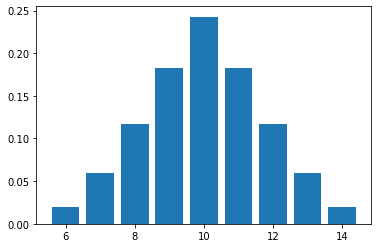

In [16]:
import matplotlib.pyplot as plt

plt.bar(dictionary.keys(), dictionary.values())

In [ ]:
### Now, with correlated attributes ###

F = [x9+x13+x24==40,
     x24==x25+x26+x27+x28+x29,
     x9>=lowerBounds[0],x9<=upperBounds[0],
     x13>=lowerBounds[1],x13<=upperBounds[1],
     x24>=lowerBounds[2],x24<=upperBounds[2],
     x25>=lowerBounds[3],x25<=upperBounds[3],
     x26>=lowerBounds[4],x26<=upperBounds[4],
     x27>=lowerBounds[5],x27<=upperBounds[5],
     x28>=lowerBounds[6],x28<=upperBounds[6],
     x29>=lowerBounds[7],x29<=upperBounds[7]]

abstractAnalysisVars = [x9,x13,x24,x25,x26,x27,x28,x29]
analysisVars = [_x9,_x13,_x24,_x25,_x26,_x27,_x28,_x29]
#solve(F)

oddsDict = [1.0, 0.8, 0.6, 0.4, 0.2]

def calculateOdds(s):
  oddsSol = []
  for i in range(len(s)):
    odd = oddsDict[int(abs(analysisVars[i]-s[i]))]
    oddsSol.append(odd)
  return (oddsSol, np.product(oddsSol))


i=0
allSols = models(F,max=50000)
allSolsList = []
for sol in allSols:
  currSol = []
  for var in abstractAnalysisVars:
    currSol.append(sol[var].as_long())
  allSolsList.append(currSol)
  i+=1
print(i)

allSolsOdds = []
allSolsSums = []
testOdd, testOddSum = calculateOdds(allSolsList[0])
for sol in allSolsList:
  o,s = calculateOdds(sol)
  allSolsOdds.append(o)
  allSolsSums.append(s)

print(allSolsOdds)
print(allSolsSums)

sumsSorted, oddsSorted, solsSorted = zip(*sorted(zip(allSolsSums, allSolsOdds,allSolsList), reverse=True))

print("There are " + str(len(sumsSorted)) + " unique solutions")
print("The most likely solution is " + str(solsSorted[0]))
print("This solution is " + str(sumsSorted[0] / sumsSorted[1]) + " times more likely than the next most likely solution")
print("The total liklihood of this solution is " + str(sumsSorted[0] / sum(sumsSorted)))


### Attribute based statistics ###

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
uniqueValues = np.unique(arrSols[:,0])

sumsSortedScaled = []
for i in range(len(sumsSorted)):
  sumsSortedScaled.append(sumsSorted[i]/sum(sumsSorted))

# creates a dictionary with keys and values
dictionary = dict.fromkeys(uniqueValues, 0.0)

for i in range(len(arrSols)):
  dictionary[arrSols[i,0]] += sumsSortedScaled[i]

attributeOddsList = []

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
dicts = []

for i in range(len(abstractAnalysisVars)):
  uniqueValues = np.unique(arrSols[:,i])

  sumsSortedScaled = []
  for ii in range(len(sumsSorted)):
    sumsSortedScaled.append(sumsSorted[ii]/sum(sumsSorted))

  # creates a dictionary with keys and values
  dictionary = dict.fromkeys(uniqueValues, 0.0)

  for ii in range(len(arrSols)):
    dictionary[arrSols[ii,i]] += sumsSortedScaled[ii]

  print(dictionary)
  dicts.append(dictionary)

KeyboardInterrupt: ignored

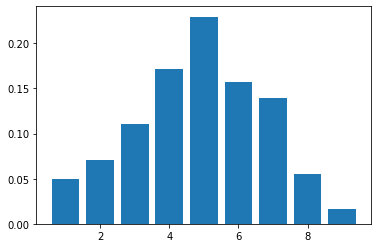

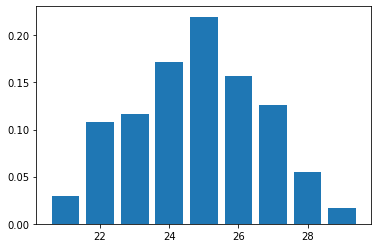

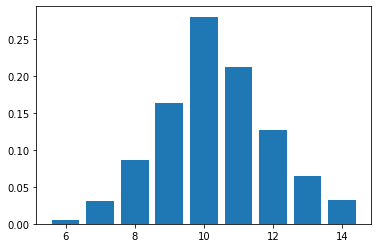

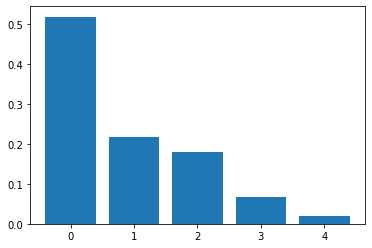

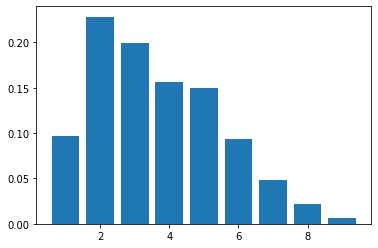

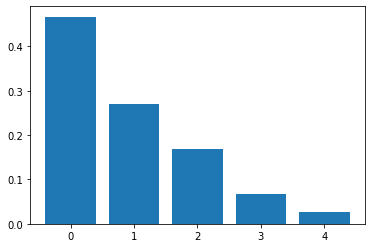

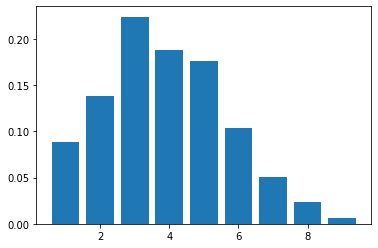

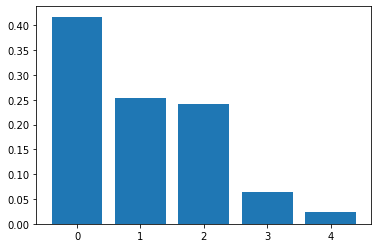

In [ ]:
import matplotlib.pyplot as plt

for d in range(len(dicts)):
  plt.bar(dicts[d].keys(), dicts[d].values())
  plt.show()

## Simulated Town of 20 (Not Nessicarily Part of the the Paper)

In [ ]:
!pip install z3-solver

import z3
from z3 import *
import itertools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Generate Town

import numpy as np

numCitizens = 20
numGenerations = 10

allGenerations = []
for i in range(numGenerations):
  randomPop = np.random.randint(0, 100, numCitizens)
  allGenerations.append(randomPop)

print(allGenerations[0])

[19 18 30 96 34 22 37 38 39 40 48 13 38  7 26 28 66 73 69 77]


In [ ]:
# Sort into age bins

x9_bin = [0,14]
x13_bin = [15,64]
x24_bin = [65,200]
x25_bin = [65,69]
x26_bin = [70,74]
x27_bin = [75,79]
x28_bin = [80,84]
x29_bin = [85,200]

bins = [x9_bin,x13_bin,x24_bin,x25_bin,x26_bin,x27_bin,x28_bin,x29_bin]

allBincounts = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allGenerations[i]
  for ii in range(numCitizens):
    currentCitizen = currentGeneration[ii]
    for iii in range(len(bins)):
      if (currentCitizen >= bins[iii][0] and currentCitizen <= bins[iii][1]):
        allBincounts[i,iii] += 1

print(allBincounts)

[[ 2. 13.  5.  2.  1.  1.  0.  1.]
 [ 1. 13.  6.  1.  2.  0.  1.  2.]
 [ 4.  9.  7.  0.  1.  0.  2.  4.]
 [ 4. 12.  4.  1.  1.  0.  1.  1.]
 [ 3.  8.  9.  1.  1.  0.  0.  7.]
 [ 1. 12.  7.  0.  2.  1.  0.  4.]
 [ 3.  9.  8.  1.  3.  0.  1.  3.]
 [ 4. 13.  3.  0.  1.  0.  1.  1.]
 [ 4. 13.  3.  0.  0.  1.  1.  1.]
 [ 6.  6.  8.  2.  0.  1.  2.  3.]]


In [ ]:
# Do random rounding
import math

def roundup(x):
    return int(math.ceil(x / 5.0)) * 5

def rounddown(x):
    return int(math.floor(x / 5.0)) * 5

transitionProbabilities = [1.0, 0.8, 0.6, 0.4, 0.2]

allGenerationsRandomRounded = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allBincounts[i]
  for ii in range(len(bins)):
    currentBin = currentGeneration[ii]
    if (currentBin%5 == 0):
      allGenerationsRandomRounded[i,ii] = currentBin
    elif (currentBin < 5):
      absoluteDifference = int(5-currentBin)
      roundedVal = np.random.choice([5,0], p=[(transitionProbabilities[absoluteDifference]),
                                              (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal
    else:
      lowerRound = rounddown(currentBin)
      upperRound = roundup(currentBin)
      absoluteDifference = int(currentBin-lowerRound)
      roundedVal = np.random.choice([lowerRound,upperRound], p=[(transitionProbabilities[absoluteDifference]),
                                                                (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal

print(allBincounts)
print(allGenerationsRandomRounded)

[[ 2. 13.  5.  2.  1.  1.  0.  1.]
 [ 1. 13.  6.  1.  2.  0.  1.  2.]
 [ 4.  9.  7.  0.  1.  0.  2.  4.]
 [ 4. 12.  4.  1.  1.  0.  1.  1.]
 [ 3.  8.  9.  1.  1.  0.  0.  7.]
 [ 1. 12.  7.  0.  2.  1.  0.  4.]
 [ 3.  9.  8.  1.  3.  0.  1.  3.]
 [ 4. 13.  3.  0.  1.  0.  1.  1.]
 [ 4. 13.  3.  0.  0.  1.  1.  1.]
 [ 6.  6.  8.  2.  0.  1.  2.  3.]]
[[ 0. 15.  5.  0.  0.  0.  0.  0.]
 [ 5. 15. 10.  0.  0.  0.  5.  0.]
 [ 0.  5. 10.  0.  0.  0.  5.  0.]
 [ 5. 10.  5.  0.  0.  0.  0.  0.]
 [ 0. 10. 10.  0.  0.  0.  0.  5.]
 [ 0. 10. 10.  0.  0.  5.  0.  5.]
 [ 5. 10.  5.  0.  5.  0.  0.  0.]
 [ 0. 15.  5.  0.  5.  0.  5.  5.]
 [ 0. 15.  5.  0.  0.  0.  5.  0.]
 [ 5.  5. 10.  0.  0.  5.  5.  0.]]


In [ ]:
# Do random roundings

import math

numRoundings = 10

def roundup(x):
    return int(math.ceil(x / 5.0)) * 5

def rounddown(x):
    return int(math.floor(x / 5.0)) * 5

transitionProbabilities = [1.0, 0.8, 0.6, 0.4, 0.2]

allGenerationsRandomRoundedIterations = np.zeros((numGenerations, numRoundings, len(bins)))
# Per Towns
#   Per Iterations
#     Per Bin


for i in range(numGenerations):
  currentGeneration = allBincounts[i]
  for j in range(numRoundings):
    for ii in range(len(bins)):
      currentBin = currentGeneration[ii]
      if (currentBin%5 == 0):
        allGenerationsRandomRoundedIterations[i,j,ii] = currentBin
      elif (currentBin < 5):
        absoluteDifference = int(5-currentBin)
        roundedVal = np.random.choice([5,0], p=[(transitionProbabilities[absoluteDifference]),
                                                (1-(transitionProbabilities[absoluteDifference]))])
        allGenerationsRandomRoundedIterations[i,j,ii] = roundedVal
      else:
        lowerRound = rounddown(currentBin)
        upperRound = roundup(currentBin)
        absoluteDifference = int(currentBin-lowerRound)
        roundedVal = np.random.choice([lowerRound,upperRound], p=[(transitionProbabilities[absoluteDifference]),
                                                                  (1-(transitionProbabilities[absoluteDifference]))])
        allGenerationsRandomRoundedIterations[i,j,ii] = roundedVal

print(allBincounts)
print(allGenerationsRandomRoundedIterations[0])

[[ 2. 13.  5.  2.  1.  1.  0.  1.]
 [ 1. 13.  6.  1.  2.  0.  1.  2.]
 [ 4.  9.  7.  0.  1.  0.  2.  4.]
 [ 4. 12.  4.  1.  1.  0.  1.  1.]
 [ 3.  8.  9.  1.  1.  0.  0.  7.]
 [ 1. 12.  7.  0.  2.  1.  0.  4.]
 [ 3.  9.  8.  1.  3.  0.  1.  3.]
 [ 4. 13.  3.  0.  1.  0.  1.  1.]
 [ 4. 13.  3.  0.  0.  1.  1.  1.]
 [ 6.  6.  8.  2.  0.  1.  2.  3.]]
[[ 0. 15.  5.  0.  0.  0.  0.  5.]
 [ 0. 15.  5.  0.  0.  0.  0.  5.]
 [ 0. 15.  5.  5.  0.  0.  0.  0.]
 [ 0. 15.  5.  5.  0.  0.  0.  0.]
 [ 5. 15.  5.  0.  0.  0.  0.  0.]
 [ 0. 10.  5.  0.  5.  0.  0.  0.]
 [ 0. 10.  5.  0.  0.  5.  0.  0.]
 [ 0. 15.  5.  5.  0.  0.  0.  5.]
 [ 0. 15.  5.  5.  0.  0.  0.  0.]
 [ 0. 10.  5.  0.  0.  5.  0.  0.]]


### How often is x% actually correct?

[84 31 97 81 23 98  1 80 17 83 17 76 65 65 73 62 61 46 90 57 32  4 48 35
 20 95 37 81 37 56]


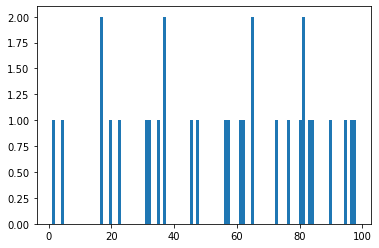

In [ ]:
import scipy.stats as ss
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(0, 101)
xU, xL = x + 0.5, x - 0.5 
scale = 1000
prob = ss.norm.cdf(xU, scale = scale) - ss.norm.cdf(xL, scale = scale)
prob = prob / prob.sum() # normalize the probabilities so their sum is 1
nums = np.random.choice(x, size = 30, p = prob)
plt.hist(nums, bins = len(x))
print(nums)

In [ ]:
# Generate Town

import numpy as np

numCitizens = 30
numGenerations = 100

allGenerations = []
for i in range(numGenerations):
  #randomPop = np.random.randint(0, 100, numCitizens)
  x = np.arange(0, 101)
  xU, xL = x + 0.5, x - 0.5 
  scale = 1000
  prob = ss.norm.cdf(xU, scale = scale) - ss.norm.cdf(xL, scale = scale)
  prob = prob / prob.sum() # normalize the probabilities so their sum is 1
  nums = np.random.choice(x, size = 30, p = prob)
  allGenerations.append(nums)



# Sort into age bins

x9_bin = [0,14]
x13_bin = [15,64]
x24_bin = [65,200]
x25_bin = [65,69]
x26_bin = [70,74]
x27_bin = [75,79]
x28_bin = [80,84]
x29_bin = [85,200]

bins = [x9_bin,x13_bin,x24_bin,x25_bin,x26_bin,x27_bin,x28_bin,x29_bin]

allBincounts = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allGenerations[i]
  for ii in range(numCitizens):
    currentCitizen = currentGeneration[ii]
    for iii in range(len(bins)):
      if (currentCitizen >= bins[iii][0] and currentCitizen <= bins[iii][1]):
        allBincounts[i,iii] += 1




import math

def roundup(x):
    return int(math.ceil(x / 5.0)) * 5

def rounddown(x):
    return int(math.floor(x / 5.0)) * 5

transitionProbabilities = [1.0, 0.8, 0.6, 0.4, 0.2]

allGenerationsRandomRounded = np.zeros((numGenerations, len(bins)))
for i in range(numGenerations):
  currentGeneration = allBincounts[i]
  for ii in range(len(bins)):
    currentBin = currentGeneration[ii]
    if (currentBin%5 == 0):
      allGenerationsRandomRounded[i,ii] = currentBin
    elif (currentBin < 5):
      absoluteDifference = int(5-currentBin)
      roundedVal = np.random.choice([5,0], p=[(transitionProbabilities[absoluteDifference]),
                                              (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal
    else:
      lowerRound = rounddown(currentBin)
      upperRound = roundup(currentBin)
      absoluteDifference = int(currentBin-lowerRound)
      roundedVal = np.random.choice([lowerRound,upperRound], p=[(transitionProbabilities[absoluteDifference]),
                                                                (1-(transitionProbabilities[absoluteDifference]))])
      allGenerationsRandomRounded[i,ii] = roundedVal


In [ ]:
import itertools


# This generates unique feasible solutions (taken from stack overflow)
def models(formula, max=10000):
    " a generator of up to max models "
    solver = Solver()
    solver.add(formula)

    count = 0
    while count<max or max==0:
        count += 1

        if solver.check() == sat:
            model = solver.model()
            yield model
            
            # exclude this model
            block = []
            for z3_decl in model: # FuncDeclRef
                arg_domains = []
                for i in range(z3_decl.arity()):
                    domain, arg_domain = z3_decl.domain(i), []
                    for j in range(domain.num_constructors()):
                        arg_domain.append( domain.constructor(j) () )
                    arg_domains.append(arg_domain)
                for args in itertools.product(*arg_domains):
                    block.append(z3_decl(*args) != model.eval(z3_decl(*args)))
            solver.add(Or(block))

In [ ]:
def calculateOdds(s):
  oddsSol = []
  for i in range(len(s)):
    odd = oddsDict[int(abs(analysisVars[i]-s[i]))]
    oddsSol.append(odd)
  return (oddsSol, np.product(oddsSol))

for t in range(1):

  x9, x13, x24, x25, x26, x27, x28, x29 = Ints('x9 x13 x24 x25 x26 x27 x28 x29')
  allAttributes = allGenerationsRandomRounded[t]
  lowerBounds = []
  upperBounds = []

  for i in range(len(allAttributes)):
    currAttribute = allAttributes[i]
    if (currAttribute == 0):
      lowerBounds.append(0)
      upperBounds.append(4)
    else:
      lowerBounds.append(currAttribute-4)
      upperBounds.append(currAttribute+4)
    
  F = [x9+x13+x24==numCitizens,
     x24==x25+x26+x27+x28+x29,
     x9>=lowerBounds[0],x9<=upperBounds[0],
     x13>=lowerBounds[1],x13<=upperBounds[1],
     x24>=lowerBounds[2],x24<=upperBounds[2],
     x25>=lowerBounds[3],x25<=upperBounds[3],
     x26>=lowerBounds[4],x26<=upperBounds[4],
     x27>=lowerBounds[5],x27<=upperBounds[5],
     x28>=lowerBounds[6],x28<=upperBounds[6],
     x29>=lowerBounds[7],x29<=upperBounds[7]]

  abstractAnalysisVars = [x9,x13,x24,x25,x26,x27,x28,x29]
  analysisVars = allAttributes

  oddsDict = [1.0, 0.8, 0.6, 0.4, 0.2]

  i=0
  allSols = models(F)
  allSolsList = []
  for sol in allSols:
    currSol = []
    for var in abstractAnalysisVars:
      currSol.append(sol[var].as_long())
    allSolsList.append(currSol)
    i+=1
  print(i)

  allSolsOdds = []
  allSolsSums = []
  testOdd, testOddSum = calculateOdds(allSolsList[0])
  for sol in allSolsList:
    o,s = calculateOdds(sol)
    allSolsOdds.append(o)
    allSolsSums.append(s)

  print(allSolsOdds)
  print(allSolsSums)

  sumsSorted, oddsSorted, solsSorted = zip(*sorted(zip(allSolsSums, allSolsOdds,allSolsList), reverse=True))

  print("The most likely solution is " + str(solsSorted[0]))
  print("This solution is " + str(sumsSorted[0] / sumsSorted[1]) + " times more likely than the next most likely solution")
  print("The total liklihood of this solution is " + str(sumsSorted[0] / sum(sumsSorted)))

  ### Attribute based statistics ###

  arrOdds = np.array(oddsSorted)
  arrSols = np.array(solsSorted)
  uniqueValues = np.unique(arrSols[:,0])

  sumsSortedScaled = []
  for i in range(len(sumsSorted)):
    sumsSortedScaled.append(sumsSorted[i]/sum(sumsSorted))

  # creates a dictionary with keys and values
  dictionary = dict.fromkeys(uniqueValues, 0.0)

  for i in range(len(arrSols)):
    dictionary[arrSols[i,0]] += sumsSortedScaled[i]

attributeOddsList = []

arrOdds = np.array(oddsSorted)
arrSols = np.array(solsSorted)
dicts = []

for i in range(len(abstractAnalysisVars)):
  uniqueValues = np.unique(arrSols[:,i])

  sumsSortedScaled = []
  for ii in range(len(sumsSorted)):
    sumsSortedScaled.append(sumsSorted[ii]/sum(sumsSorted))

  # creates a dictionary with keys and values
  dictionary = dict.fromkeys(uniqueValues, 0.0)

  for ii in range(len(arrSols)):
    dictionary[arrSols[ii,i]] += sumsSortedScaled[ii]

  print(dictionary)
  dicts.append(dictionary)


10000
[[0.4, 0.2, 0.2, 0.8, 0.2, 1.0, 1.0, 0.2], [0.8, 0.4, 0.4, 1.0, 1.0, 0.2, 0.8, 0.4], [1.0, 0.2, 0.8, 0.6, 0.8, 0.4, 1.0, 0.6], [1.0, 0.4, 0.6, 1.0, 1.0, 0.6, 1.0, 0.8], [1.0, 0.4, 0.6, 1.0, 1.0, 0.8, 1.0, 0.6], [1.0, 0.4, 0.6, 1.0, 1.0, 1.0, 1.0, 0.4], [0.8, 0.6, 0.6, 1.0, 1.0, 1.0, 1.0, 0.4], [1.0, 0.2, 0.8, 1.0, 1.0, 1.0, 1.0, 0.2], [0.2, 0.2, 0.4, 1.0, 0.6, 0.6, 1.0, 0.2], [0.4, 0.2, 0.6, 1.0, 0.6, 0.8, 1.0, 0.2], [0.6, 0.2, 0.8, 1.0, 0.8, 0.8, 1.0, 0.2], [0.2, 0.2, 0.4, 1.0, 0.8, 0.4, 1.0, 0.2], [0.4, 0.2, 0.6, 1.0, 0.8, 0.6, 1.0, 0.2], [0.8, 0.2, 1.0, 1.0, 0.8, 1.0, 1.0, 0.2], [0.6, 0.2, 0.8, 1.0, 0.6, 1.0, 1.0, 0.2], [0.2, 0.2, 0.4, 1.0, 0.2, 1.0, 1.0, 0.2], [0.4, 0.2, 0.6, 1.0, 0.4, 1.0, 1.0, 0.2], [0.2, 0.2, 0.4, 1.0, 0.4, 0.8, 1.0, 0.2], [0.4, 0.2, 0.6, 1.0, 1.0, 0.4, 1.0, 0.2], [0.2, 0.2, 0.4, 1.0, 1.0, 0.2, 1.0, 0.2], [0.8, 0.2, 1.0, 1.0, 1.0, 0.8, 1.0, 0.2], [0.6, 0.2, 0.8, 1.0, 1.0, 0.6, 1.0, 0.2], [0.8, 0.4, 0.8, 1.0, 1.0, 1.0, 1.0, 0.2], [0.6, 0.6, 0.8, 1.0, 1.0, 1

In [ ]:
print(allBincounts[0])
print(allGenerationsRandomRounded[0])

print(sumsSorted)
print(solsSorted)

[ 2. 18. 10.  2.  0.  3.  3.  2.]
[ 5. 20. 10.  0.  0.  0.  0.  5.]
(0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.16384000000000007, 0.15360000000000004, 0.15360000000000004, 0.15360000000000004, 0.15360000000000004, 0.15360000000000004, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.15360000000000001, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.147456, 0.1474

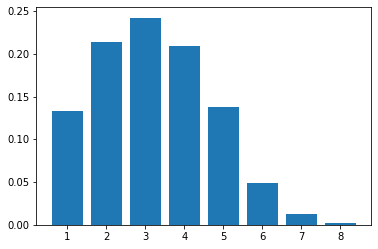

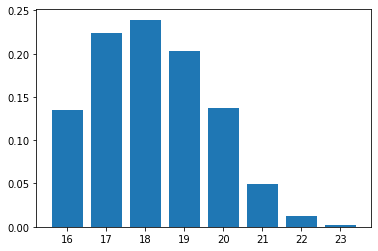

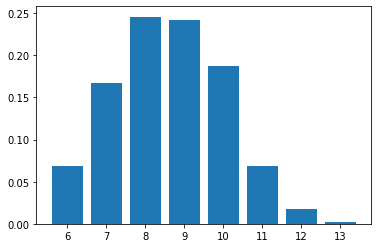

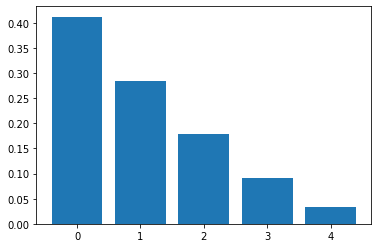

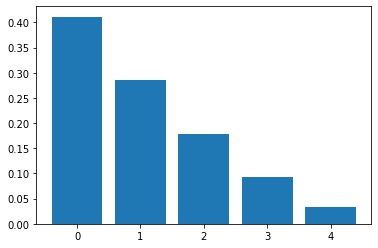

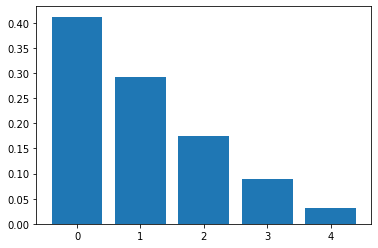

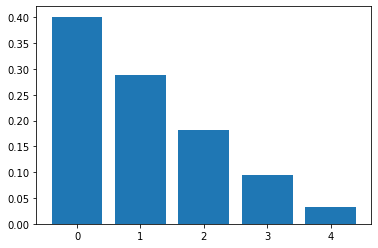

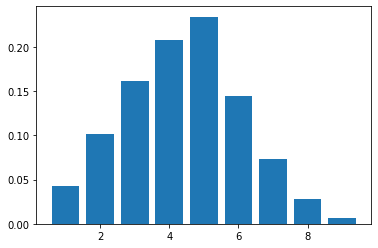

In [ ]:
import matplotlib.pyplot as plt

for d in range(len(dicts)):
  plt.bar(dicts[d].keys(), dicts[d].values())
  plt.show()